In [1]:
import torchaudio
from audiocraft.models import MusicGen
from audiocraft.data.audio import audio_write

import os
import typing as tp

import torch

from audiocraft.models.encodec import CompressionModel
from audiocraft.models.lm import LMModel
from audiocraft.models.builders import get_debug_compression_model, get_debug_lm_model
from audiocraft.models.loaders import load_compression_model, load_lm_model, HF_MODEL_CHECKPOINTS_MAP
from audiocraft.data.audio_utils import convert_audio
from audiocraft.modules.conditioners import ConditioningAttributes, WavCondition
from audiocraft.utils.autocast import TorchAutocast

model = MusicGen.get_pretrained('melody')

In [2]:
self = model

In [22]:
attributes, prompt_tokens = self._prepare_tokens_and_attributes(["classical samba brazilian peaceful music"], None)
print("attributes:", attributes)
print("prompt_tokens:", prompt_tokens)

attributes: [ConditioningAttributes(text={'description': 'classical samba brazilian peaceful music'}, wav={'self_wav': WavCondition(wav=tensor([[0.]], device='cuda:0'), length=tensor([0], device='cuda:0'), path='null_wav')})]
prompt_tokens: None


In [28]:
duration = 30

use_sampling = False
top_k = 250
top_p = 0.0
temperature = 1.0
cfg_coef = 3.0
two_step_cfg = False

assert duration <= 30, "The MusicGen cannot generate more than 30 seconds"

self.generation_params = {
    'max_gen_len': int(duration * self.frame_rate),
    'use_sampling': use_sampling,
    'temp': temperature,
    'top_k': top_k,
    'top_p': top_p,
    'cfg_coef': cfg_coef,
    'two_step_cfg': two_step_cfg,
}

In [33]:
with self.autocast:
    gen_tokens = self.lm.generate(prompt_tokens, attributes, callback=None, **self.generation_params)

everything below is for 30 seconds.

In [34]:
assert gen_tokens.dim() == 3
print("gen_tokens information")
print("Shape:", gen_tokens.shape)
print("Dtype:", gen_tokens.dtype)
print("Contents:", gen_tokens)

gen_tokens information
Shape: torch.Size([1, 4, 1500])
Dtype: torch.int64
Contents: tensor([[[1927, 1318,  162,  ...,   83,   83,   83],
         [1839, 1538, 1478,  ..., 2044, 2044, 2044],
         [1900,  969, 1895,  ..., 2019, 2019, 2019],
         [1537, 1537, 1983,  ..., 1770, 1770, 1758]]], device='cuda:0')


In [35]:
with torch.no_grad():
    gen_audio = self.compression_model.decode(gen_tokens, None)
print("gen_audio information")
print("Shape:", gen_audio.shape)
print("Dtype:", gen_audio.dtype)
print("Contents:", gen_audio)

#for the shape, ignore the first dimension, which is the batch size... I think.

gen_audio information
Shape: torch.Size([1, 1, 960000])
Dtype: torch.float32
Contents: tensor([[[ 0.0599,  0.0556,  0.0574,  ..., -0.0024, -0.0018, -0.0033]]],
       device='cuda:0')


In [36]:
for idx, one_wav in enumerate(gen_audio):
    # Will save under {idx}.wav, with loudness normalization at -14 db LUFS.
    audio_write("/home/ubuntu/no_sampling.wav", one_wav.cpu(), model.sample_rate, strategy="loudness", loudness_compressor=True)

CLIPPING /home/ubuntu/no_sampling.wav happening with proba (a bit of clipping is okay): 0.0016145833069458604 maximum scale:  3.476524591445923


In [16]:
print(model.sample_rate)

32000


encoding attempts

In [3]:
from audiocraft.data.audio import audio_read

audio_path = "/home/ubuntu/charm.wav"
seek_time = 85

audio = audio_read(audio_path, seek_time=seek_time, duration=30)
wav, sr = audio
print("audio information")
print("## SR ##")
print(sr)
print("## WAV ##")
print("Shape:", wav.shape)
print("Dtype:", wav.dtype)
print("Contents:", wav)

audio information
## SR ##
44100
## WAV ##
Shape: torch.Size([2, 1323000])
Dtype: torch.float32
Contents: tensor([[-0.3113, -0.3369, -0.3376,  ..., -0.3008, -0.2576, -0.2414],
        [-0.3613, -0.3812, -0.3878,  ..., -0.2267, -0.2178, -0.2682]])


In [4]:
from audiocraft.data.audio import normalize_audio

normalized_audio = normalize_audio(
    wav=wav,
    normalize=True,
    strategy="peak",
    peak_clip_headroom_db=1,
    rms_headroom_db=18,
    loudness_headroom_db=14,
    log_clipping=True,
    sample_rate=sr,
    stem_name="test"
)

print("normalized_audio information")
print("Shape:", normalized_audio.shape)
print("Dtype:", normalized_audio.dtype)
print("Contents:", normalized_audio)

normalized_audio information
Shape: torch.Size([2, 1323000])
Dtype: torch.float32
Contents: tensor([[-0.2774, -0.3002, -0.3009,  ..., -0.2681, -0.2296, -0.2151],
        [-0.3220, -0.3398, -0.3456,  ..., -0.2020, -0.1941, -0.2391]])


# Sample Rates
The model's sample rate as seen above is 32K (32,000)

Our audio is at 44.1K (44,100). We need to convert it.

Some calcs.:

960000/32000 = 30 -> (tensor length)/(model.sample_rate) = (audio len. in seconds)
1323000/44100 = 30 -> (tensor length)/(detected sample rate) = (audio len. in seconds)

Note that, our audio is stereo, that's why we have 2 channels. We need to port it to mono too.

In [5]:
from torchaudio import load
from torch.nn import functional as F

audio_path = "/home/ubuntu/charm.wav"
seek_time = 20
duration = 30

start_time = seek_time
end_time = start_time + duration

# replicate what audio_read does
# I will not modify it... I will just use it as a reference

audio = load(audio_path)
wav, sr = audio

#arr, org_sr = torchaudio.load('path')
#arr = torchaudio.functional.resample(arr, orig_freq=org_sr, new_freq=new_sr)

n_sr = 32000
n_wav = torchaudio.functional.resample(wav, orig_freq=sr, new_freq=n_sr)

print("n_wav information")
print("Shape:", n_wav.shape)
print("Dtype:", n_wav.dtype)

start_sample = int(start_time * n_sr)
end_sample = int(end_time * n_sr)

f_wav = n_wav[:, start_sample:end_sample]

print("f_wav information")
print("Shape:", f_wav.shape)
print("Dtype:", f_wav.dtype)

m_wav = f_wav.mean(dim=0, keepdim=True)
print("m_wav information")
print("Shape:", m_wav.shape)
print("Dtype:", m_wav.dtype)

save_bef = True

if save_bef is True:
    torchaudio.save("/home/ubuntu/bef.wav", f_wav, sample_rate=n_sr)


n_wav information
Shape: torch.Size([2, 6285470])
Dtype: torch.float32
f_wav information
Shape: torch.Size([2, 960000])
Dtype: torch.float32
m_wav information
Shape: torch.Size([1, 960000])
Dtype: torch.float32


In [6]:
# Encoder testing

r_wav = m_wav.unsqueeze(1)

print("r_wav information")
print("Shape:", r_wav.shape)
print("Dtype:", r_wav.dtype)

# move to gpu
r_wav = r_wav.cuda()

with torch.no_grad():
    gen_audio = self.compression_model.encode(r_wav)

codes, scale = gen_audio
print("codes information")
print("Contents:", codes)
print("Shape:", codes.shape)
print("Dtype:", codes.dtype)

print("scale:")
print(scale)

r_wav information
Shape: torch.Size([1, 1, 960000])
Dtype: torch.float32
codes information
Contents: tensor([[[ 353,  353, 1195,  ...,  831,  429, 1698],
         [1758, 1450,  707,  ...,  821,  419,  176],
         [1748, 1979, 1885,  ...,  906,  491,  315],
         [1560,  268,  565,  ..., 1814, 1163,  510]]], device='cuda:0')
Shape: torch.Size([1, 4, 1500])
Dtype: torch.int64
scale:
None


In [7]:
attributes, prompt_tokens = self._prepare_tokens_and_attributes(["a jazz song, light guitar, japanese singer in the back, calm, masterpiece"], None)
print("attributes:", attributes)
print("prompt_tokens:", prompt_tokens)

attributes: [ConditioningAttributes(text={'description': 'a jazz song, light guitar, japanese singer in the back, calm, masterpiece'}, wav={'self_wav': WavCondition(wav=tensor([[0.]], device='cuda:0'), length=tensor([0], device='cuda:0'), path='null_wav')})]
prompt_tokens: None


In [8]:
with self.autocast:
    lm_out = model.lm.compute_predictions(
        codes=codes,
        conditions=attributes
    )

In [9]:
import lovely_tensors as lt

In [41]:
logits, logits_mask = lm_out.logits, lm_out.mask
print("logits information")
#print("Contents:", logits)
print("Shape:", logits.shape)
print("Dtype:", logits.dtype)

print("logits_mask information")
#print("Contents:", logits_mask)
print("Shape:", logits_mask.shape)
print("Dtype:", logits_mask.dtype)

logits information
Shape: torch.Size([1, 4, 1500, 2048])
Dtype: torch.float16
logits_mask information
Shape: torch.Size([1, 4, 1500])
Dtype: torch.bool


In [42]:
from torch.optim import Adam
opt = Adam(model.lm.parameters(), lr=1e-4)

In [49]:
from torch.nn import CrossEntropyLoss
loss_function = CrossEntropyLoss()

# 4.1. Expand target (encoded_audio) and logits_mask to match logits shape
expanded_target = codes.unsqueeze(-1).expand_as(logits)  # [B, K, T, card]
expanded_mask = logits_mask.unsqueeze(-1).expand_as(logits)  # [B, K, T, card]

# 4.2. Mask the logits and expanded_target with expanded_mask
masked_logits = logits * expanded_mask
masked_target = expanded_target * expanded_mask

# 4.3. Reshape tensors and gather correct logits that correspond to the ground truth
reshaped_logits = masked_logits.view(-1, logits.shape[-1]) 
reshaped_target = masked_target.view(-1, logits.shape[-1])

reshaped_logits_mask = logits_mask.view(-1)

correct_logits = reshaped_logits[reshaped_logits_mask]
ground_truth = reshaped_target[reshaped_logits_mask].argmax(dim=1)

# Calculate loss
loss = loss_function(correct_logits, ground_truth)

In [50]:
loss

tensor(12.0938, device='cuda:0', dtype=torch.float16, grad_fn=<NllLossBackward0>)

In [54]:
# 5. Optimize model parameters
opt.zero_grad()
loss.backward(retain_graph=True)
opt.step()

RuntimeError: Trying to backward through the graph a second time (or directly access saved tensors after they have already been freed). Saved intermediate values of the graph are freed when you call .backward() or autograd.grad(). Specify retain_graph=True if you need to backward through the graph a second time or if you need to access saved tensors after calling backward.

In [52]:
opt.zero_grad()

In [38]:
criterion = torch.nn.CrossEntropyLoss()

flattened_logits = logits.view(-1, logits.shape[-1])
flattened_target = codes.view(-1)

# Apply mask to logits
logits_mask = logits_mask.view(-1)
valid_logits = flattened_logits[logits_mask.bool()]
valid_target = flattened_target[logits_mask.bool()]

# Calculate loss
loss = criterion(valid_logits, valid_target)

/home/ubuntu/env/lib/python3.10/site-packages/numpy/core/_methods.py:250: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
/home/ubuntu/env/lib/python3.10/site-packages/lovely_numpy/repr_plt.py:150: RuntimeWarning: invalid value encountered in multiply
  x_pos = (x_mean + s*x_std)


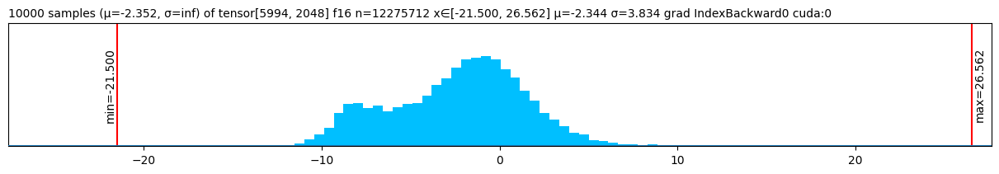

In [12]:
lt.plot(valid_logits)

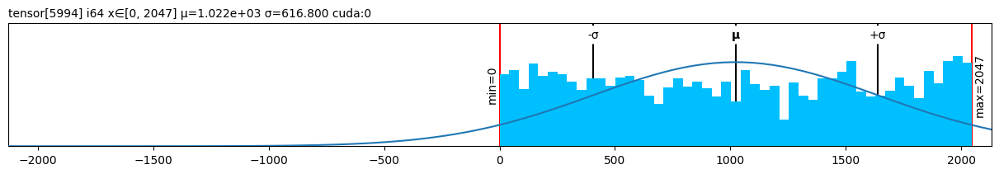

In [13]:
lt.plot(valid_target)

In [22]:
def print_tensor(tensor: torch.Tensor):
    # Save the current print option settings
    original_print_options = torch._tensor_str.PRINT_OPTS
    # Set print options to display all tensor elements
    torch.set_printoptions(precision=4, threshold=None, edgeitems=None, linewidth=180, profile=None)

    # Print the entire tensor
    print(tensor)

    # Restore the original print option settings
    torch.set_printoptions(**original_print_options)

In [30]:
print(valid_target.shape)
print(valid_logits.shape)

torch.Size([5994])
torch.Size([5994, 2048])


/home/ubuntu/env/lib/python3.10/site-packages/numpy/core/_methods.py:215: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)
/home/ubuntu/env/lib/python3.10/site-packages/numpy/core/_methods.py:250: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
/home/ubuntu/env/lib/python3.10/site-packages/lovely_numpy/repr_plt.py:150: RuntimeWarning: invalid value encountered in multiply
  x_pos = (x_mean + s*x_std)


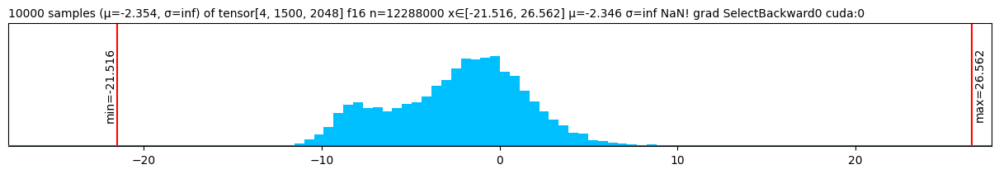

In [124]:
logits.plt


torch.Size([4, 1500])


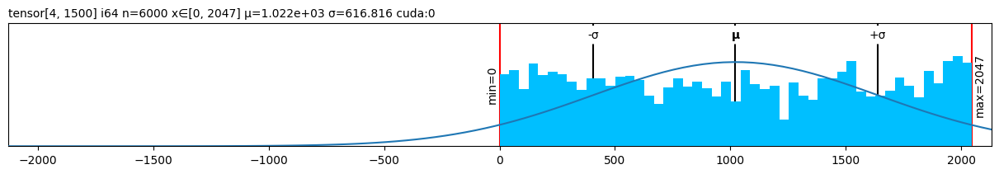

In [132]:
codes = codes.squeeze(0)
print(codes.shape)
codes.plt


In [133]:
print(codes)

tensor[4, 1500] i64 n=6000 (47Kb) x∈[0, 2047] μ=1.022e+03 σ=616.816 cuda:0


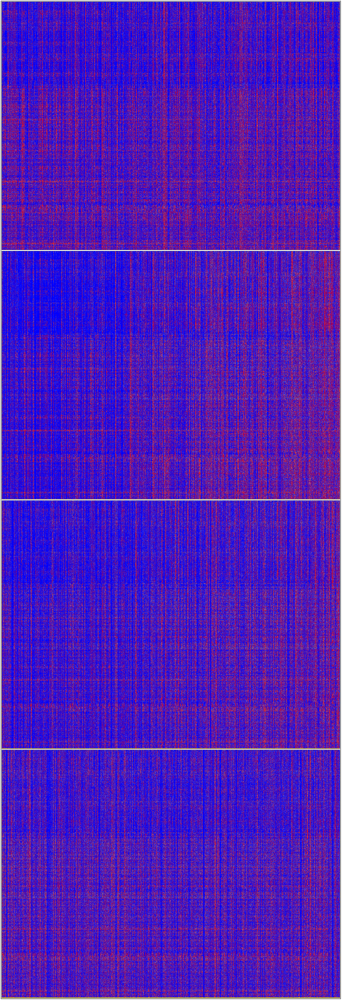

In [119]:
logits.chans()

In [120]:
logits_mask.chans()

In [49]:
# Now we decode

with torch.no_grad():
    gen_audio = self.compression_model.decode(codes, scale)
print("gen_audio information")
print("Shape:", gen_audio.shape)
print("Dtype:", gen_audio.dtype)
print("Contents:", gen_audio)


gen_audio information
Shape: torch.Size([1, 1, 960000])
Dtype: torch.float32
Contents: tensor([[[0.0370, 0.0340, 0.0571,  ..., 0.0462, 0.0348, 0.0651]]],
       device='cuda:0')


In [1]:
# for idx, one_wav in enumerate(gen_audio):
#     # Will save under {idx}.wav, with loudness normalization at -14 db LUFS.
#     audio_write("/home/ubuntu/processed", 
#                 one_wav.cpu(), 
#                 model.sample_rate, 
#                 strategy="loudness", 
#                 loudness_compressor=True)

gen_audio = gen_audio.cpu()

for idx, one_wav in enumerate(gen_audio):
    torchaudio.save("/home/ubuntu/decoded_raw.wav", one_wav, sample_rate=self.compression_model.sample_rate)

NameError: name 'gen_audio' is not defined

# Training

- Idea: Use raw forward (musicgen) calls to train, not the processed ones from `_sample_next_token`

although I think `_sample_next_token` does the necessary things to join everything together.... idk